# Read multitone waveform `.mat` files

This notebook loads all `weightsN*BW*.mat` files in `weights/` and interprets them as:

- `fn`: tone offsets around the 875 MHz carrier.
- `weights`: complex tone weights (`rows = tones`, `columns = input power points`).
- `Pdc`: model-predicted DC values for the optimized weights.
- `inPwrVec`: input RF power vector in mW.

Filename convention: `weightsN{tones}BW{bandwidth_kHz}.mat`.

For each file, this notebook derives:
- signal bandwidth = `BW` (kHz),
- TX sample rate = `2 * BW` (Hz),
so that signal bandwidth equals half the sample rate.


In [1]:
from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    from scipy.io import loadmat
except Exception as exc:
    raise ImportError(
        "Could not import scipy.io.loadmat. Install compatible numpy/scipy versions first."
    ) from exc

plt.rcParams["figure.figsize"] = (10, 4)
plt.rcParams["axes.grid"] = True


In [2]:
FC_HZ = 875e6
DATA_DIR_CANDIDATES = [Path("weights"), Path("data/weights"), Path("../data/weights")]
DATA_DIR = next((p for p in DATA_DIR_CANDIDATES if p.exists()), DATA_DIR_CANDIDATES[0])

print(f"Data dir: {DATA_DIR.resolve()}")
print(f"Carrier frequency: {FC_HZ/1e6:.1f} MHz")
print("Bandwidth/sample rate are parsed from filenames: weightsN{N}BW{BW_kHz}.mat")
if not DATA_DIR.exists():
    print(f"Warning: {DATA_DIR} not found. Candidates were: {DATA_DIR_CANDIDATES}")


Data dir: C:\Users\Calle\OneDrive\Documenten\GitHub\RF-waveform-optimization\data\weights
Carrier frequency: 875.0 MHz
Bandwidth/sample rate are parsed from filenames: weightsN{N}BW{BW_kHz}.mat


In [3]:
FILE_RE = re.compile(r"weightsN(?P<n>\d+)BW(?P<bw>\d+)\.mat$", re.IGNORECASE)


def parse_file_info(path: Path) -> dict:
    match = FILE_RE.search(path.name)
    if not match:
        raise ValueError(f"Unexpected filename format: {path.name}")

    n_tones = int(match.group("n"))
    bw_khz = int(match.group("bw"))
    bw_hz = float(bw_khz) * 1e3
    sample_rate_hz = 2.0 * bw_hz

    return {
        "n_tones": n_tones,
        "bw_khz": bw_khz,
        "bw_hz": bw_hz,
        "sample_rate_hz": sample_rate_hz,
    }


def parse_n_tones(path: Path) -> int:
    return int(parse_file_info(path)["n_tones"])


def _to_1d(x):
    return np.atleast_1d(np.asarray(x).squeeze())


def _to_2d(x):
    arr = np.asarray(x).squeeze()
    if arr.ndim == 0:
        return arr.reshape(1, 1)
    if arr.ndim == 1:
        return arr[:, None]
    return arr


def _normalize_fn_to_offsets_hz(fn_raw_hz, fc_hz, signal_bw_hz):
    fn_raw_hz = np.asarray(fn_raw_hz, dtype=float).ravel()
    if fn_raw_hz.size == 0:
        raise ValueError("Empty fn array")

    # Some files store absolute RF frequencies (around carrier), others offsets.
    if np.nanmax(np.abs(fn_raw_hz)) > 2.0 * float(signal_bw_hz):
        fn_offsets_hz = fn_raw_hz - float(fc_hz)
        fn_mode = "absolute_rf_hz"
    else:
        fn_offsets_hz = fn_raw_hz.copy()
        fn_mode = "offset_hz"

    return fn_offsets_hz, fn_mode


def load_waveform_file(path: Path) -> dict:
    info = parse_file_info(path)

    mat = loadmat(path, squeeze_me=True)
    required = ["fn", "weights", "Pdc", "inPwrVec"]
    missing = [k for k in required if k not in mat]
    if missing:
        raise KeyError(f"{path.name} missing fields: {missing}")

    fn_raw = _to_1d(mat["fn"]).astype(float)
    fn, fn_mode = _normalize_fn_to_offsets_hz(fn_raw, FC_HZ, info["bw_hz"])
    weights = _to_2d(mat["weights"])
    pdc = _to_1d(mat["Pdc"]).astype(float)
    in_pwr_mw = _to_1d(mat["inPwrVec"]).astype(float)

    # If dimensions are transposed in file, align so rows map to tones.
    if weights.shape[0] != fn.size and weights.shape[1] == fn.size:
        weights = weights.T

    if weights.shape[0] != fn.size:
        raise ValueError(
            f"{path.name}: weights row count ({weights.shape[0]}) must match number of tones ({fn.size})."
        )
    if weights.shape[1] != in_pwr_mw.size:
        raise ValueError(
            f"{path.name}: weights column count ({weights.shape[1]}) must match inPwrVec length ({in_pwr_mw.size})."
        )
    if pdc.size != in_pwr_mw.size:
        raise ValueError(
            f"{path.name}: Pdc length ({pdc.size}) must match inPwrVec length ({in_pwr_mw.size})."
        )

    return {
        "file": path,
        "n_tones": int(info["n_tones"]),
        "bw_khz": int(info["bw_khz"]),
        "bw_hz": float(info["bw_hz"]),
        "sample_rate_hz": float(info["sample_rate_hz"]),
        "fn": fn,
        "fn_mode": fn_mode,
        "fn_raw": fn_raw,
        "weights": weights,
        "Pdc": pdc,
        "inPwrVec_mW": in_pwr_mw,
        "inPwrVec_dBm": 10 * np.log10(in_pwr_mw),
        "f_abs_Hz": FC_HZ + fn,
    }


In [4]:
mat_files = sorted(
    DATA_DIR.glob("weightsN*BW*.mat"),
    key=lambda p: (parse_file_info(p)["bw_khz"], parse_file_info(p)["n_tones"]),
)
if not mat_files:
    raise FileNotFoundError("No files matching weightsN*BW*.mat found in weights/.")

waveforms = [load_waveform_file(p) for p in mat_files]
print(f"Loaded {len(waveforms)} files: {[w['file'].name for w in waveforms]}")


Loaded 8 files: ['weightsN4BW1000.mat', 'weightsN8BW1000.mat', 'weightsN16BW1000.mat', 'weightsN32BW1000.mat', 'weightsN4BW20000.mat', 'weightsN8BW20000.mat', 'weightsN16BW20000.mat', 'weightsN32BW20000.mat']


In [5]:
# Inspect each MAT file (classic MAT and MATLAB v7.3).
from pathlib import Path

def _safe_sample(arr, n=8):
    arr = np.asarray(arr)
    if arr.size == 0:
        return []
    return arr.ravel()[:n].tolist()

def inspect_mat_file(path: Path, sample_items: int = 8):
    print(f"\n=== {path.name} ===")

    try:
        mat = loadmat(path, squeeze_me=True, struct_as_record=False)
        print("format: MATLAB <= v7.2 (read via scipy.io.loadmat)")

        for key, value in sorted(mat.items()):
            if key.startswith("__"):
                continue
            arr = np.asarray(value)
            shape = getattr(arr, "shape", None)
            print(f"{key}: type={type(value).__name__}, shape={shape}, dtype={arr.dtype}")
            if np.issubdtype(arr.dtype, np.number):
                print(f"  sample: {_safe_sample(arr, sample_items)}")
        return
    except (NotImplementedError, ValueError):
        pass

    try:
        import h5py
    except Exception as exc:
        raise ImportError("This file appears to be MATLAB v7.3. Install h5py to inspect it.") from exc

    print("format: MATLAB v7.3 (read via h5py)")
    with h5py.File(path, "r") as f:
        for key in sorted(f.keys()):
            obj = f[key]
            shape = getattr(obj, "shape", None)
            dtype = getattr(obj, "dtype", None)
            print(f"{key}: type={type(obj).__name__}, shape={shape}, dtype={dtype}")
            if hasattr(obj, "dtype") and np.issubdtype(obj.dtype, np.number):
                try:
                    data = obj[()]
                    print(f"  sample: {_safe_sample(data, sample_items)}")
                except Exception:
                    print("  sample: <not available>")

if "mat_files" in globals() and len(mat_files) > 0:
    files_to_inspect = [Path(p) for p in mat_files]
else:
    candidate_dirs = [Path("weights"), Path("data/weights"), Path("../data/weights")]
    files_to_inspect = []
    for d in candidate_dirs:
        files_to_inspect.extend(sorted(d.glob("weightsN*BW*.mat")))

if not files_to_inspect:
    raise FileNotFoundError("No .mat files found. Check your DATA_DIR or candidate_dirs.")

for fpath in files_to_inspect:
    inspect_mat_file(Path(fpath))



=== weightsN4BW1000.mat ===
format: MATLAB <= v7.2 (read via scipy.io.loadmat)
None: type=MatlabOpaque, shape=(1,), dtype=[('s0', 'O'), ('s1', 'O'), ('s2', 'O'), ('arr', 'O')]
Ns: type=int, shape=(), dtype=int32
  sample: [10000]
Pdc: type=ndarray, shape=(16,), dtype=float64
  sample: [1.5034471353898485e-05, 6.971391051049563e-05, 0.00018712725698591886, 0.0004633695277656594, 0.001027501108479982, 0.002424143155159488, 0.004796096206229818, 0.008336493378749015]
T: type=float, shape=(), dtype=float64
  sample: [0.00030000000000007153]
bw: type=int, shape=(), dtype=int32
  sample: [1000000]
efficiency: type=ndarray, shape=(61,), dtype=float64
  sample: [0.0024, 0.0022, 0.0021, 0.0022, 0.0022, 0.0023, 0.0034999999999999996, 0.0042]
energyEffFnc: type=mat_struct, shape=(), dtype=object
fn: type=ndarray, shape=(4,), dtype=float64
  sample: [874500000.0, 874833333.3333334, 875166666.6666666, 875500000.0]
frequency_mhz: type=int, shape=(), dtype=int32
  sample: [875]
inPwrVec: type=ndarra

In [6]:
summary = pd.DataFrame(
    {
        "file": [w["file"].name for w in waveforms],
        "bandwidth_kHz": [w["bw_khz"] for w in waveforms],
        "sample_rate_MSa_s": [w["sample_rate_hz"] / 1e6 for w in waveforms],
        "n_tones_from_name": [w["n_tones"] for w in waveforms],
        "fn_len": [w["fn"].size for w in waveforms],
        "weights_shape": [w["weights"].shape for w in waveforms],
        "n_input_powers": [w["inPwrVec_mW"].size for w in waveforms],
        "Pdc_len": [w["Pdc"].size for w in waveforms],
        "input_power_min_mW": [np.min(w["inPwrVec_mW"]) for w in waveforms],
        "input_power_max_mW": [np.max(w["inPwrVec_mW"]) for w in waveforms],
    }
)
summary = summary.sort_values(["bandwidth_kHz", "n_tones_from_name"]).reset_index(drop=True)

summary


,file,bandwidth_kHz,sample_rate_MSa_s,n_tones_from_name,fn_len,weights_shape,n_input_powers,Pdc_len,input_power_min_mW,input_power_max_mW
0,weightsN4BW1000.mat,1000,2.0,4,4,"(4, 16)",16,16,0.001,1.0
1,weightsN8BW1000.mat,1000,2.0,8,8,"(8, 16)",16,16,0.001,1.0
2,weightsN16BW1000.mat,1000,2.0,16,16,"(16, 16)",16,16,0.001,1.0
3,weightsN32BW1000.mat,1000,2.0,32,32,"(32, 16)",16,16,0.001,1.0
4,weightsN4BW20000.mat,20000,40.0,4,4,"(4, 16)",16,16,0.001,1.0
5,weightsN8BW20000.mat,20000,40.0,8,8,"(8, 16)",16,16,0.001,1.0
6,weightsN16BW20000.mat,20000,40.0,16,16,"(16, 16)",16,16,0.001,1.0
7,weightsN32BW20000.mat,20000,40.0,32,32,"(32, 16)",16,16,0.001,1.0


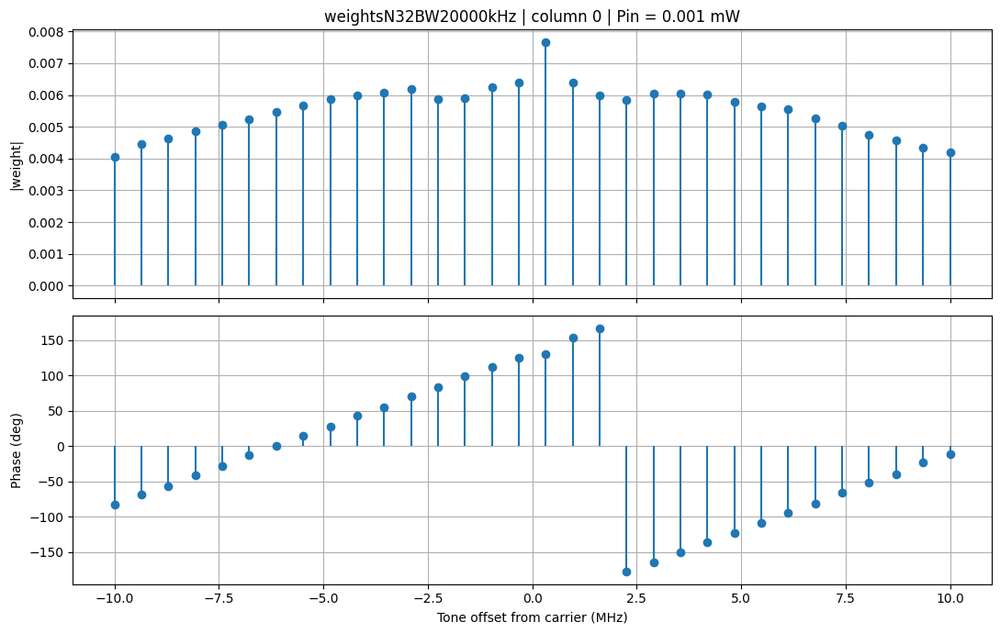

In [7]:
# Choose one waveform and one power-index column for detailed frequency-domain visualization.
selected_n_tones = 32
selected_bw_khz = 20000
selected_power_idx = 0

wf = next(
    (w for w in waveforms if w["n_tones"] == selected_n_tones and w["bw_khz"] == selected_bw_khz),
    None,
)
if wf is None:
    available = sorted((w["n_tones"], w["bw_khz"]) for w in waveforms)
    raise ValueError(f"(N,BW_kHz)=({selected_n_tones},{selected_bw_khz}) not available. Choose from {available}")

selected_power_idx = int(np.clip(selected_power_idx, 0, wf["weights"].shape[1] - 1))
tone_offsets_mhz = wf["fn"] / 1e6
w_col = wf["weights"][:, selected_power_idx]

fig, ax = plt.subplots(2, 1, figsize=(11, 7), sharex=True)
ax[0].stem(tone_offsets_mhz, np.abs(w_col), basefmt=" ")
ax[0].set_ylabel("|weight|")
ax[0].set_title(
    f"weightsN{wf['n_tones']}BW{wf['bw_khz']}kHz | column {selected_power_idx} | "
    f"Pin = {wf['inPwrVec_mW'][selected_power_idx]:.3f} mW"
)

ax[1].stem(tone_offsets_mhz, np.angle(w_col, deg=True), basefmt=" ")
ax[1].set_xlabel("Tone offset from carrier (MHz)")
ax[1].set_ylabel("Phase (deg)")
plt.tight_layout()


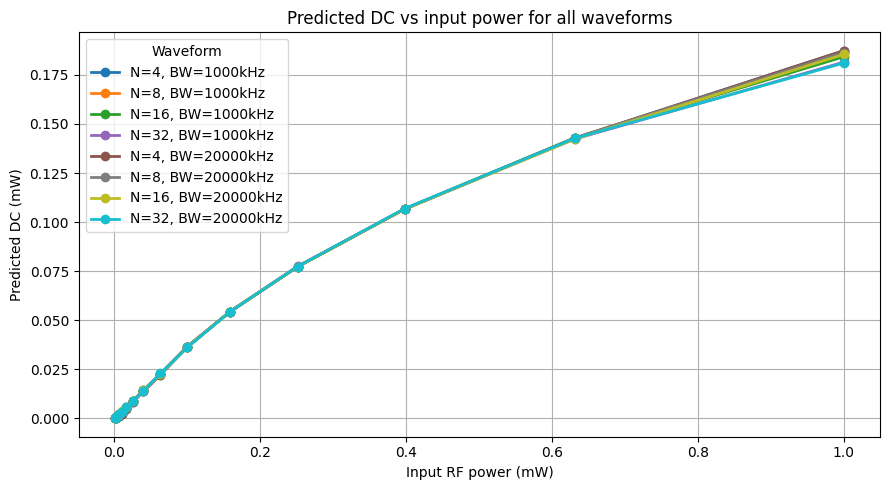

In [8]:
# All waveforms on one figure with different colors.
fig, ax = plt.subplots(figsize=(9, 5))
colors = plt.cm.tab10(np.linspace(0, 1, len(waveforms)))

for c, w in zip(colors, waveforms):
    ax.plot(
        w["inPwrVec_mW"],
        w["Pdc"],
        marker="o",
        color=c,
        linewidth=2,
        label=f"N={w['n_tones']}, BW={w['bw_khz']}kHz",
    )

ax.set_xlabel("Input RF power (mW)")
ax.set_ylabel("Predicted DC (mW)")
ax.set_title("Predicted DC vs input power for all waveforms")
ax.legend(title="Waveform", frameon=True)
plt.tight_layout()


Skipping narrowband overlay: harvester-chart-data.csv not found


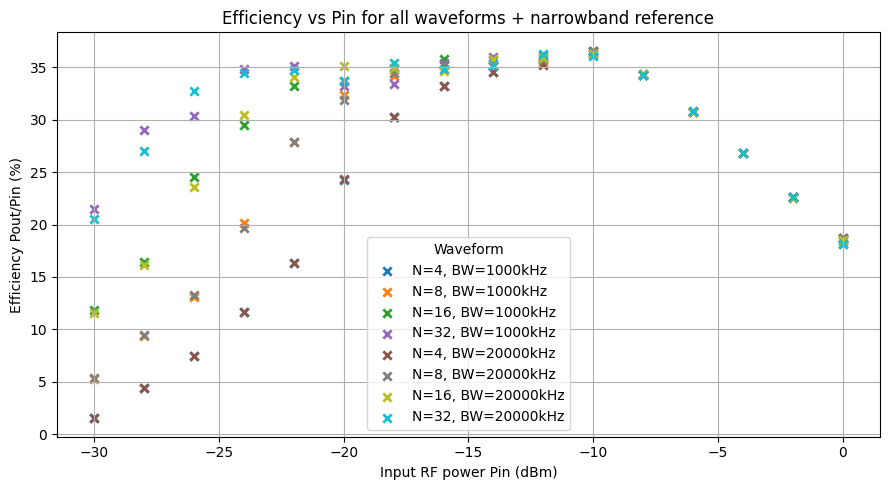

In [9]:
# Efficiency plot (assuming Pout = Pdc), with narrowband reference overlay.
fig, ax = plt.subplots(figsize=(9, 5))
colors = plt.cm.tab10(np.linspace(0, 1, len(waveforms)))

for c, w in zip(colors, waveforms):
    pin = np.asarray(w["inPwrVec_mW"], dtype=float)
    pout = np.asarray(w["Pdc"], dtype=float)
    eta = np.divide(pout, pin, out=np.full_like(pout, np.nan, dtype=float), where=pin > 0)
    ax.scatter(
        10 * np.log10(pin),
        eta * 100.0,
        marker="x",
        color=c,
        linewidth=2,
        label=f"N={w['n_tones']}, BW={w['bw_khz']}kHz",
    )

# Optional overlay: narrowband measured efficiency curve.
nb_csv = Path("harvester-chart-data.csv")
if nb_csv.exists():
    nb = pd.read_csv(nb_csv)
    required_cols = {"level_dbm", "efficiency"}
    if required_cols.issubset(nb.columns):
        nb = nb.sort_values("level_dbm")
        ax.plot(
            nb["level_dbm"].to_numpy(dtype=float),
            nb["efficiency"].to_numpy(dtype=float),
            color="black",
            linestyle="--",
            linewidth=2,
            label="Measured",
            zorder=5,
        )
    else:
        print(f"Skipping {nb_csv}: missing columns {required_cols}")
else:
    print(f"Skipping narrowband overlay: {nb_csv} not found")

ax.set_xlabel("Input RF power Pin (dBm)")
ax.set_ylabel("Efficiency Pout/Pin (%)")
ax.set_title("Efficiency vs Pin for all waveforms + narrowband reference")
ax.legend(title="Waveform", frameon=True)
plt.tight_layout()


## Notes

- Tones are expected between `-BW/2` and `+BW/2` with `BW = 20 MHz`.
- The notebook uses `fn` as baseband offsets in Hz.
- If a `.mat` file stores absolute RF frequencies in `fn`, they are auto-converted to offsets via `fn_offset = fn - 875e6`.
- Absolute tone frequencies are `875e6 + fn` (Hz).
- Each `weights` column corresponds to one sampled RF input power in `inPwrVec`.
- Efficiency in the added plot is computed as `Pdc / inPwrVec` (i.e., `Pout = Pdc`).
- The same plot overlays narrowband measured efficiency from `harvester-chart-data.csv` (`level_dbm` vs `efficiency`).
- If needed, change `selected_n_tones` and `selected_power_idx` to inspect another waveform or power point.
- The export cell can generate one IQ file per input-power column (`EXPORT_COLUMNS="all"`).


## Time-Domain Preprocessing For UHD Playback

This section reproduces the TX preprocessing used by `transmit_b210_dwell.py`:
- synthesize periodic IQ blocks in time domain,
- normalize average power to a target (`E[|x|^2]`),
- enforce `|IQ| <= 1.0` via additional scaling,
- export `.npz` IQ files for direct UHD playback.
- optionally oversample IQ at export-time so UHD script remains playout-only.


In [10]:
def synthesize_raw_periodic_block(fn_hz, weights_col, sample_rate_hz, block_size):
    fn_hz = np.asarray(fn_hz, dtype=float).ravel().copy()
    if fn_hz.size == 0:
        raise ValueError("fn_hz must contain at least one tone")

    bin_hz = float(sample_rate_hz) / float(block_size)
    nyquist_hz = 0.5 * float(sample_rate_hz)

    # +fs/2 and -fs/2 collapse to the same discrete-time frequency (Nyquist bin).
    # Shift +fs/2 inward by one bin so multitone sets keep unique peaks.
    pos_nyq = np.isclose(fn_hz, nyquist_hz, atol=0.25 * bin_hz, rtol=0.0)
    if np.any(pos_nyq):
        fn_hz[pos_nyq] = nyquist_hz - bin_hz

    bins = np.rint((fn_hz / sample_rate_hz) * block_size).astype(np.int64)
    bins_mod = np.mod(bins, int(block_size))
    if np.unique(bins_mod).size != bins_mod.size:
        n_dup = int(bins_mod.size - np.unique(bins_mod).size)
        raise ValueError(
            f"Tone-to-bin quantization produced {n_dup} duplicate bin(s). "
            f"Increase block_size or adjust tone offsets."
        )

    quantized_fn_hz = bins.astype(np.float64) * (sample_rate_hz / block_size)
    freq_error_hz = quantized_fn_hz - fn_hz

    n = np.arange(block_size, dtype=np.float64)
    phase = (2j * np.pi / block_size) * np.outer(n, bins)
    raw = np.exp(phase) @ np.asarray(weights_col, dtype=np.complex128)

    raw_power = float(np.mean(np.abs(raw) ** 2))
    raw_peak = float(np.max(np.abs(raw)))
    if raw_power <= 0 or raw_peak <= 0:
        raise ValueError("Synthesis produced zero signal")

    return {
        "raw": raw,
        "fn_hz_used": fn_hz,
        "bins": bins,
        "quantized_fn_hz": quantized_fn_hz,
        "freq_error_hz": freq_error_hz,
        "raw_peak": raw_peak,
        "raw_power": raw_power,
    }


def scale_raw_periodic_block(raw_info, target_power=0.8, max_amplitude=1.0):
    if target_power <= 0:
        raise ValueError("target_power must be > 0")
    if max_amplitude <= 0:
        raise ValueError("max_amplitude must be > 0")

    raw = np.asarray(raw_info["raw"], dtype=np.complex128)
    raw_power = float(raw_info["raw_power"])
    raw_peak = float(raw_info["raw_peak"])

    max_feasible_power = (max_amplitude / raw_peak) ** 2 * raw_power
    final_target_power = min(float(target_power), float(max_feasible_power))

    scale = np.sqrt(final_target_power / raw_power)
    iq = raw * scale
    final_peak = float(np.max(np.abs(iq)))

    # Numerical safety guard.
    if final_peak > max_amplitude:
        guard = (max_amplitude * (1.0 - 1e-7)) / final_peak
        iq = iq * guard
        scale *= guard
        final_peak = float(np.max(np.abs(iq)))

    final_power = float(np.mean(np.abs(iq) ** 2))
    peak_limited = final_target_power < target_power - 1e-12

    return {
        "iq": iq.astype(np.complex64),
        "fn_hz_used": raw_info["fn_hz_used"],
        "bins": raw_info["bins"],
        "quantized_fn_hz": raw_info["quantized_fn_hz"],
        "freq_error_hz": raw_info["freq_error_hz"],
        "scale": float(scale),
        "raw_peak": raw_peak,
        "raw_power": raw_power,
        "final_peak": float(final_peak),
        "final_power": float(final_power),
        "peak_limited": bool(peak_limited),
        "max_feasible_power": float(max_feasible_power),
        "target_power": float(final_target_power),
    }



def oversample_periodic_iq(samples, sample_rate_hz, factor):
    factor = int(factor)
    if factor <= 1:
        return np.asarray(samples, dtype=np.complex64), float(sample_rate_hz)

    x = np.asarray(samples, dtype=np.complex64).ravel()
    n = int(x.size)
    if n < 2:
        raise ValueError("Need at least 2 IQ samples for oversampling")

    m = int(n * factor)
    x_f = np.fft.fftshift(np.fft.fft(x, n=n))
    pad_total = m - n
    pad_left = pad_total // 2
    pad_right = pad_total - pad_left
    y_f = np.pad(x_f, (pad_left, pad_right), mode="constant")

    # NumPy ifft has 1/M scaling; multiply by M/N to preserve amplitude.
    y = np.fft.ifft(np.fft.ifftshift(y_f), n=m) * float(factor)
    return y.astype(np.complex64), float(sample_rate_hz) * float(factor)


In [11]:
# Export IQ blocks for UHD replay with one common average power across all files.
# For multitone waveforms, one IQ file is generated per selected input-power column.
import json

TX_OVERSAMPLE = 1                  # Export-time oversampling factor for UHD playout (1 keeps fs=2*bw)
BLOCK_SIZE = 65536
TARGET_POWER_REQUESTED = 0.8
MAX_AMPLITUDE = 1.0
EQUAL_POWER_TOL = 1e-6

# Choose which multitone files/columns to export.
EXPORT_TONES = [4, 8, 16, 32]      # subset of available N values
EXPORT_BW_KHZ = "all"              # "all" or list, e.g. [1000, 20000]
EXPORT_COLUMNS = "all"             # list of column indices or "all" (maps to inPwrVec entries)

# Optional narrowband export (maps to --tone 1 in UHD script).
INCLUDE_NARROWBAND = True
NARROWBAND_OFFSET_HZ = 100e3
NARROWBAND_BW_KHZ = "auto"         # "auto" -> all selected EXPORT_BW_KHZ

# Optional single-tone DC export (maps to --tone 0 in UHD script).
INCLUDE_DC_TONE0 = True
DC_TONE0_BW_KHZ = "auto"            # "auto" -> all selected EXPORT_BW_KHZ

repo_root = Path.cwd()
if not (repo_root / "data").exists() and (repo_root.parent / "data").exists():
    repo_root = repo_root.parent
EXPORT_DIR = repo_root / "data" / "tx_iq"
EXPORT_DIR.mkdir(parents=True, exist_ok=True)
TX_GAIN_MEASUREMENT_JSONL = repo_root / "data" / "meas-tones-power.jsonl"
TX_GAIN_SUFFIX_PRECISION = 2


if TX_OVERSAMPLE < 1 or int(TX_OVERSAMPLE) != TX_OVERSAMPLE:
    raise ValueError("TX_OVERSAMPLE must be a positive integer")
TX_OVERSAMPLE = int(TX_OVERSAMPLE)


def _resolve_cols(selector, n_cols):
    if isinstance(selector, str) and selector.lower() == "all":
        return list(range(n_cols))
    cols = [int(c) for c in selector]
    for c in cols:
        if c < 0 or c >= n_cols:
            raise ValueError(f"Column index {c} out of range [0, {n_cols - 1}]")
    return list(dict.fromkeys(cols))


def _resolve_bws(selector, available_bws_khz):
    available_bws_khz = [int(bw) for bw in available_bws_khz]
    if isinstance(selector, str) and selector.lower() == "all":
        return sorted(available_bws_khz)

    selected = [int(bw) for bw in selector]
    missing = [bw for bw in selected if bw not in available_bws_khz]
    if missing:
        raise ValueError(f"Requested bandwidth(s) {missing} kHz not available. Have {sorted(available_bws_khz)}")
    return sorted(list(dict.fromkeys(selected)))


def _reading_power_w(reading):
    if not isinstance(reading, dict):
        return None

    if "scope_power_w" in reading and reading["scope_power_w"] is not None:
        power_w = float(reading["scope_power_w"])
        if np.isfinite(power_w) and power_w > 0:
            return power_w

    if "pwr_pw" in reading and reading["pwr_pw"] is not None:
        power_w = float(reading["pwr_pw"]) * 1e-12
        if np.isfinite(power_w) and power_w > 0:
            return power_w

    return None


def _record_mean_power_mw(record):
    readings = record.get("readings")
    if not isinstance(readings, list) or len(readings) == 0:
        return None

    powers_w = []
    for reading in readings:
        power_w = _reading_power_w(reading)
        if power_w is not None:
            powers_w.append(power_w)

    if len(powers_w) == 0:
        return None

    return float(np.mean(np.asarray(powers_w, dtype=float)) * 1e3)


def _load_tx_gain_lookup(path):
    if not path.exists():
        raise FileNotFoundError(f"TX gain measurement file not found: {path}")

    grouped = {}
    with path.open("r", encoding="utf-8") as handle:
        for line_number, line in enumerate(handle, start=1):
            if not line.strip():
                continue
            record = json.loads(line)

            tone = record.get("tone")
            bw_khz = record.get("bw_khz")
            gain_db = record.get("gain_db")
            if tone is None or bw_khz is None or gain_db is None:
                continue

            mean_power_mw = _record_mean_power_mw(record)
            if mean_power_mw is None:
                continue

            case = (int(tone), int(bw_khz))
            grouped.setdefault(case, {}).setdefault(float(gain_db), []).append(mean_power_mw)

    lookup = {}
    for case, by_gain in grouped.items():
        pairs = []
        for gain_db, values in by_gain.items():
            pairs.append((float(np.mean(np.asarray(values, dtype=float))), float(gain_db)))
        pairs.sort(key=lambda item: item[0])
        if pairs:
            lookup[case] = pairs

    if len(lookup) == 0:
        raise RuntimeError(f"No usable TX gain mapping extracted from {path}")

    return lookup


def _format_gain_suffix(gain_db):
    text = f"{float(gain_db):.{TX_GAIN_SUFFIX_PRECISION}f}"
    return text.rstrip("0").rstrip(".")


_FALLBACK_WARNED_CASES = set()


def _has_tx_gain_case(n_tones, bw_khz, lookup):
    case = (int(n_tones), int(bw_khz))
    if case in lookup:
        return True
    return (0, case[1]) in lookup


def _closest_tx_gain(pin_mw, n_tones, bw_khz, lookup):
    case = (int(n_tones), int(bw_khz))
    pairs = lookup.get(case)
    used_case = case

    if not pairs and case[0] != 0:
        fallback_case = (0, case[1])
        pairs = lookup.get(fallback_case)
        if pairs:
            used_case = fallback_case

    if not pairs:
        available_cases = sorted(lookup.keys())
        raise RuntimeError(
            f"No TX gain mapping available for (N={case[0]}, BW={case[1]}kHz) in {TX_GAIN_MEASUREMENT_JSONL}. "
            f"Available cases: {available_cases}"
        )

    if used_case != case and case not in _FALLBACK_WARNED_CASES:
        print(
            f"Using tone 0 TX gain mapping for (N={case[0]}, BW={case[1]}kHz) "
            f"from case (N={used_case[0]}, BW={used_case[1]}kHz)."
        )
        _FALLBACK_WARNED_CASES.add(case)

    measured_powers = np.asarray([pair[0] for pair in pairs], dtype=float)
    gains = np.asarray([pair[1] for pair in pairs], dtype=float)
    idx = int(np.argmin(np.abs(measured_powers - float(pin_mw))))
    return float(gains[idx]), float(measured_powers[idx])


tx_gain_lookup = _load_tx_gain_lookup(TX_GAIN_MEASUREMENT_JSONL)
print(f"Loaded TX gain mapping from {TX_GAIN_MEASUREMENT_JSONL} for {len(tx_gain_lookup)} (N, BW) case(s).")


available_bws_khz = sorted({int(wf["bw_khz"]) for wf in waveforms if wf["n_tones"] in EXPORT_TONES})
if not available_bws_khz:
    raise RuntimeError(f"No waveforms found for EXPORT_TONES={EXPORT_TONES}")

selected_bws_khz = _resolve_bws(EXPORT_BW_KHZ, available_bws_khz)

missing_cases = [
    (int(tone), int(bw_khz))
    for tone in EXPORT_TONES
    for bw_khz in selected_bws_khz
    if not _has_tx_gain_case(int(tone), int(bw_khz), tx_gain_lookup)
]
if missing_cases:
    if isinstance(EXPORT_BW_KHZ, str) and EXPORT_BW_KHZ.lower() == "all":
        selected_bws_khz = [
            int(bw_khz)
            for bw_khz in selected_bws_khz
            if all(_has_tx_gain_case(int(tone), int(bw_khz), tx_gain_lookup) for tone in EXPORT_TONES)
        ]
        dropped_bws = sorted({bw for _, bw in missing_cases if bw not in selected_bws_khz})
        if dropped_bws:
            print(f"Skipping BW without full TX gain mapping for selected tones: {dropped_bws}")
    else:
        raise RuntimeError(
            f"Missing TX gain mapping for requested (N, BW) case(s): {missing_cases}. "
            f"Available cases: {sorted(tx_gain_lookup.keys())}"
        )

if not selected_bws_khz:
    raise RuntimeError(
        "No bandwidths left after applying TX gain mapping constraints. "
        f"Available mapping cases: {sorted(tx_gain_lookup.keys())}"
    )

candidates = []

for wf in waveforms:
    if wf["n_tones"] not in EXPORT_TONES:
        continue
    if int(wf["bw_khz"]) not in selected_bws_khz:
        continue

    sample_rate_source_hz = float(wf["sample_rate_hz"])
    signal_bw_hz = float(wf["bw_hz"])
    expected_source_hz = 2.0 * signal_bw_hz
    if not np.isclose(sample_rate_source_hz, expected_source_hz, rtol=1e-12, atol=1e-6):
        raise RuntimeError(
            f"{wf['file'].name}: sample_rate_hz={sample_rate_source_hz:.6f} must equal 2*bw_hz={expected_source_hz:.6f}"
        )

    if np.max(np.abs(np.asarray(wf["fn"], dtype=float))) > (sample_rate_source_hz / 2 + 1e-6):
        raise ValueError(
            f"Tone offsets for {wf['file'].name} exceed Nyquist after normalization. "
            f"Got range [{np.min(wf['fn']):.3f}, {np.max(wf['fn']):.3f}] Hz at fs={sample_rate_source_hz:.3f} Hz"
        )

    n_cols = int(wf["weights"].shape[1])
    n_pin = int(np.asarray(wf["inPwrVec_mW"]).size)
    if n_cols != n_pin:
        raise ValueError(
            f"{wf['file'].name}: weights columns ({n_cols}) must match inPwrVec length ({n_pin})"
        )

    cols = _resolve_cols(EXPORT_COLUMNS, n_cols)

    for col in cols:
        pin_mw = float(wf["inPwrVec_mW"][col])
        tx_gain_db, mapped_prf_mw = _closest_tx_gain(
            pin_mw=pin_mw,
            n_tones=int(wf["n_tones"]),
            bw_khz=int(wf["bw_khz"]),
            lookup=tx_gain_lookup,
        )

        raw_info = synthesize_raw_periodic_block(
            fn_hz=wf["fn"],
            weights_col=wf["weights"][:, col],
            sample_rate_hz=sample_rate_source_hz,
            block_size=BLOCK_SIZE,
        )

        candidates.append(
            {
                "mode": "multitone",
                "source": wf["file"].name,
                "n_tones": int(wf["n_tones"]),
                "bw_khz": int(wf["bw_khz"]),
                "signal_bw_hz": signal_bw_hz,
                "sample_rate_source_hz": sample_rate_source_hz,
                "column": int(col),
                "pin_mW": pin_mw,
                "tx_gain_db": tx_gain_db,
                "mapped_prf_mW": mapped_prf_mw,
                "tone_offsets_requested_hz": np.asarray(wf["fn"], dtype=float),
                "raw_info": raw_info,
            }
        )

if INCLUDE_NARROWBAND:
    if isinstance(NARROWBAND_BW_KHZ, str) and NARROWBAND_BW_KHZ.lower() == "auto":
        nb_bws_khz = list(selected_bws_khz)
    else:
        nb_bws_khz = _resolve_bws(NARROWBAND_BW_KHZ, selected_bws_khz)

    for bw_khz in nb_bws_khz:
        signal_bw_hz = float(bw_khz) * 1e3
        sample_rate_source_hz = 2.0 * signal_bw_hz

        raw_nb = synthesize_raw_periodic_block(
            fn_hz=np.array([NARROWBAND_OFFSET_HZ], dtype=float),
            weights_col=np.array([1.0 + 0.0j], dtype=np.complex128),
            sample_rate_hz=sample_rate_source_hz,
            block_size=BLOCK_SIZE,
        )

        candidates.append(
            {
                "mode": "narrowband",
                "source": "synthetic",
                "n_tones": 1,
                "bw_khz": int(bw_khz),
                "signal_bw_hz": signal_bw_hz,
                "sample_rate_source_hz": sample_rate_source_hz,
                "column": -1,
                "pin_mW": np.nan,
                "tx_gain_db": np.nan,
                "mapped_prf_mW": np.nan,
                "tone_offsets_requested_hz": np.array([float(NARROWBAND_OFFSET_HZ)]),
                "raw_info": raw_nb,
            }
        )

if INCLUDE_DC_TONE0:
    if isinstance(DC_TONE0_BW_KHZ, str) and DC_TONE0_BW_KHZ.lower() == "auto":
        dc_bws_khz = list(selected_bws_khz)
    else:
        dc_bws_khz = _resolve_bws(DC_TONE0_BW_KHZ, selected_bws_khz)

    for bw_khz in dc_bws_khz:
        signal_bw_hz = float(bw_khz) * 1e3
        sample_rate_source_hz = 2.0 * signal_bw_hz

        raw_dc = synthesize_raw_periodic_block(
            fn_hz=np.array([0.0], dtype=float),
            weights_col=np.array([1.0 + 0.0j], dtype=np.complex128),
            sample_rate_hz=sample_rate_source_hz,
            block_size=BLOCK_SIZE,
        )

        candidates.append(
            {
                "mode": "dc_tone0",
                "source": "synthetic",
                "n_tones": 0,
                "bw_khz": int(bw_khz),
                "signal_bw_hz": signal_bw_hz,
                "sample_rate_source_hz": sample_rate_source_hz,
                "column": -1,
                "pin_mW": np.nan,
                "tx_gain_db": np.nan,
                "mapped_prf_mW": np.nan,
                "tone_offsets_requested_hz": np.array([0.0], dtype=float),
                "raw_info": raw_dc,
            }
        )

if len(candidates) == 0:
    raise RuntimeError("No candidates selected for export.")

# Compute one common feasible power after optional oversampling.
max_feasible_per_signal = []
for c in candidates:
    probe = np.asarray(c["raw_info"]["raw"], dtype=np.complex64)
    probe_rate_hz = float(c["sample_rate_source_hz"])
    if TX_OVERSAMPLE > 1:
        probe, probe_rate_hz = oversample_periodic_iq(probe, probe_rate_hz, TX_OVERSAMPLE)

    probe_power = float(np.mean(np.abs(probe) ** 2))
    probe_peak = float(np.max(np.abs(probe)))
    if probe_power <= 0 or probe_peak <= 0:
        raise RuntimeError(f"Invalid probe signal for {c['source']} (N={c['n_tones']}, BW={c['bw_khz']}kHz)")

    c["probe_power"] = probe_power
    c["probe_peak"] = probe_peak
    max_feasible_per_signal.append((MAX_AMPLITUDE / probe_peak) ** 2 * probe_power)

common_target_power = min(float(TARGET_POWER_REQUESTED), float(np.min(max_feasible_per_signal)))

if common_target_power < TARGET_POWER_REQUESTED - 1e-12:
    print(
        f"Requested target power {TARGET_POWER_REQUESTED:.6g} cannot satisfy |IQ| <= {MAX_AMPLITUDE:.6g} for all signals."
    )
    print(f"Using common feasible power instead: {common_target_power:.6g}")
else:
    print(f"Using requested common target power: {common_target_power:.6g}")

records = []

for c in candidates:
    synth = scale_raw_periodic_block(
        raw_info=c["raw_info"],
        target_power=common_target_power,
        max_amplitude=MAX_AMPLITUDE,
    )

    iq_tx = np.asarray(synth["iq"], dtype=np.complex64)
    tx_rate_hz = float(c["sample_rate_source_hz"])

    if TX_OVERSAMPLE > 1:
        iq_tx, tx_rate_hz = oversample_periodic_iq(iq_tx, tx_rate_hz, TX_OVERSAMPLE)

    post_scale = 1.0
    tx_peak = float(np.max(np.abs(iq_tx)))
    if tx_peak > MAX_AMPLITUDE + 1e-6:
        post_scale = (MAX_AMPLITUDE * (1.0 - 1e-7)) / tx_peak
        iq_tx = (iq_tx * post_scale).astype(np.complex64)
        tx_peak = float(np.max(np.abs(iq_tx)))

    tx_power = float(np.mean(np.abs(iq_tx) ** 2))

    # Enforce equal average power across all exported files after oversampling.
    if tx_power > 0:
        eq_scale = np.sqrt(common_target_power / tx_power)
        if np.abs(eq_scale - 1.0) > 1e-12:
            iq_eq = (iq_tx * eq_scale).astype(np.complex64)
            eq_peak = float(np.max(np.abs(iq_eq)))
            if eq_peak <= MAX_AMPLITUDE + 1e-6:
                iq_tx = iq_eq
                post_scale *= float(eq_scale)
                tx_peak = eq_peak
                tx_power = float(np.mean(np.abs(iq_tx) ** 2))

    pin_mw = float(c["pin_mW"]) if np.isfinite(c["pin_mW"]) else np.nan
    pin_dbm = 10 * np.log10(pin_mw) if pin_mw > 0 else np.nan
    tx_gain_db = float(c["tx_gain_db"]) if np.isfinite(c["tx_gain_db"]) else np.nan
    mapped_prf_mw = float(c["mapped_prf_mW"]) if np.isfinite(c["mapped_prf_mW"]) else np.nan

    if c["mode"] == "multitone":
        if not np.isfinite(tx_gain_db):
            raise RuntimeError(
                f"Missing mapped TX gain for N={c['n_tones']}, BW={c['bw_khz']}kHz, column={c['column']}"
            )
        out_name = (
            f"iq_N{c['n_tones']}_BW{c['bw_khz']}_TXG{_format_gain_suffix(tx_gain_db)}dB_col{c['column']}.npz"
        )
    elif c["mode"] == "narrowband":
        out_name = f"iq_nb_BW{c['bw_khz']}.npz"
    elif c["mode"] == "dc_tone0":
        out_name = f"iq_dc_BW{c['bw_khz']}.npz"
    else:
        raise ValueError(f"Unsupported export mode: {c['mode']!r}")

    out_path = EXPORT_DIR / out_name

    np.savez(
        out_path,
        iq=iq_tx,
        sample_rate_hz=float(tx_rate_hz),
        sample_rate_source_hz=float(c["sample_rate_source_hz"]),
        oversample_factor=int(TX_OVERSAMPLE),
        signal_bw_hz=float(c["signal_bw_hz"]),
        bw_khz=int(c["bw_khz"]),
        center_freq_hz=float(FC_HZ),
        block_size=int(iq_tx.size),
        block_size_source=int(BLOCK_SIZE),
        n_tones=int(c["n_tones"]),
        column=int(c["column"]),
        pin_mW=pin_mw,
        pin_dBm=pin_dbm,
        tx_gain_db=tx_gain_db,
        mapped_prf_mW=mapped_prf_mw,
        tone_offsets_hz=np.asarray(synth["fn_hz_used"], dtype=float),
        tone_offsets_requested_hz=np.asarray(c["tone_offsets_requested_hz"], dtype=float),
        quantized_tone_offsets_hz=np.asarray(synth["quantized_fn_hz"], dtype=float),
        freq_error_hz=np.asarray(synth["freq_error_hz"], dtype=float),
        target_power=float(common_target_power),
        target_power_requested=float(TARGET_POWER_REQUESTED),
        max_amplitude=float(MAX_AMPLITUDE),
        scale=float(synth["scale"] * post_scale),
        raw_power=float(synth["raw_power"]),
        final_power=float(tx_power),
        raw_peak=float(synth["raw_peak"]),
        final_peak=float(tx_peak),
        peak_limited=bool(synth["peak_limited"]),
        max_feasible_power=float(synth["max_feasible_power"]),
    )

    records.append(
        {
            "mode": c["mode"],
            "source": c["source"],
            "bw_khz": int(c["bw_khz"]),
            "signal_bw_hz": float(c["signal_bw_hz"]),
            "tx_sample_rate_source_hz": float(c["sample_rate_source_hz"]),
            "n_tones": int(c["n_tones"]),
            "column": int(c["column"]),
            "pin_mW": pin_mw,
            "pin_dBm": pin_dbm,
            "tx_gain_db": tx_gain_db,
            "mapped_prf_mW": mapped_prf_mw,
            "tx_sample_rate_hz": tx_rate_hz,
            "oversample_factor": TX_OVERSAMPLE,
            "samples": int(iq_tx.size),
            "raw_power": synth["raw_power"],
            "final_power": tx_power,
            "raw_peak": synth["raw_peak"],
            "final_peak": tx_peak,
            "peak_limited": synth["peak_limited"],
            "max_feasible_power": synth["max_feasible_power"],
            "max_abs_freq_error_hz": float(np.max(np.abs(synth["freq_error_hz"]))),
            "iq_file": str(out_path),
        }
    )

export_summary = pd.DataFrame(records)
if not export_summary.empty:
    export_summary = export_summary.sort_values(["bw_khz", "mode", "n_tones", "column"]).reset_index(drop=True)

# Enforce equal-power condition (within tolerance).
power_span = float(export_summary["final_power"].max() - export_summary["final_power"].min())
print(f"Exported {len(export_summary)} IQ file(s) to: {EXPORT_DIR.resolve()}")
print(f"Export bandwidths (kHz): {selected_bws_khz}")
print(f"TX oversample factor: {TX_OVERSAMPLE}x")
print(f"Export columns: {EXPORT_COLUMNS}")
print(f"Common target power used: {common_target_power:.6g}")
print(f"Final power span across exported files: {power_span:.6g}")
if power_span > EQUAL_POWER_TOL:
    raise RuntimeError(
        f"Equal-power condition failed: span={power_span:.6g} exceeds tolerance {EQUAL_POWER_TOL:.6g}"
    )

export_summary


Loaded TX gain mapping from c:\Users\Calle\OneDrive\Documenten\GitHub\RF-waveform-optimization\data\meas-tones-power.jsonl for 5 (N, BW) case(s).
Skipping BW without full TX gain mapping for selected tones: [20000]
Requested target power 0.8 cannot satisfy |IQ| <= 1 for all signals.
Using common feasible power instead: 0.0342348
Exported 66 IQ file(s) to: C:\Users\Calle\OneDrive\Documenten\GitHub\RF-waveform-optimization\data\tx_iq
Export bandwidths (kHz): [1000]
TX oversample factor: 1x
Export columns: all
Common target power used: 0.0342348
Final power span across exported files: 1.11759e-08


,mode,source,bw_khz,signal_bw_hz,tx_sample_rate_source_hz,n_tones,column,pin_mW,pin_dBm,tx_gain_db,...,oversample_factor,samples,raw_power,final_power,raw_peak,final_peak,peak_limited,max_feasible_power,max_abs_freq_error_hz,iq_file
0,dc_tone0,synthetic,1000,1000000.0,2000000.0,0,-1,NaN,NaN,NaN,...,1,65536,1.000000,0.034235,1.000000,0.185027,False,1.000000,0.000000,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
1,multitone,weightsN4BW1000.mat,1000,1000000.0,2000000.0,4,0,0.001000,-30.0,59.8,...,1,65536,0.001000,0.034235,0.063160,0.369554,False,0.250675,10.172526,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
2,multitone,weightsN4BW1000.mat,1000,1000000.0,2000000.0,4,1,0.001585,-28.0,60.6,...,1,65536,0.001585,0.034235,0.079183,0.368017,False,0.252775,10.172526,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
3,multitone,weightsN4BW1000.mat,1000,1000000.0,2000000.0,4,2,0.002512,-26.0,62.2,...,1,65536,0.002512,0.034235,0.099792,0.368410,False,0.252235,10.172526,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
4,multitone,weightsN4BW1000.mat,1000,1000000.0,2000000.0,4,3,0.003981,-24.0,63.6,...,1,65536,0.003981,0.034235,0.119252,0.349703,False,0.279943,10.172526,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,multitone,weightsN32BW1000.mat,1000,1000000.0,2000000.0,32,12,0.251189,-6.0,84.8,...,1,65536,0.251189,0.034235,0.914844,0.337739,False,0.300128,14.766570,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
62,multitone,weightsN32BW1000.mat,1000,1000000.0,2000000.0,32,13,0.398107,-4.0,84.8,...,1,65536,0.398107,0.034235,1.154332,0.338505,False,0.298771,14.766570,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
63,multitone,weightsN32BW1000.mat,1000,1000000.0,2000000.0,32,14,0.630957,-2.0,84.8,...,1,65536,0.630957,0.034235,1.361320,0.317098,False,0.340471,14.766570,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...
64,multitone,weightsN32BW1000.mat,1000,1000000.0,2000000.0,32,15,1.000000,0.0,84.8,...,1,65536,1.000000,0.034235,1.897595,0.351105,False,0.277711,14.766570,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...


,iq_file,samples,avg_power,peak_amp,peak_power,crest_db
0,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.185027,0.034235,-0.000001
1,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.369554,0.136570,6.008884
2,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.368017,0.135436,5.972667
3,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.368410,0.135726,5.981948
4,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.349703,0.122292,5.529307
...,...,...,...,...,...,...
61,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.337739,0.114067,5.226937
62,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.338505,0.114585,5.246614
63,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.317098,0.100551,4.679203
64,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,0.034235,0.351105,0.123275,5.564069


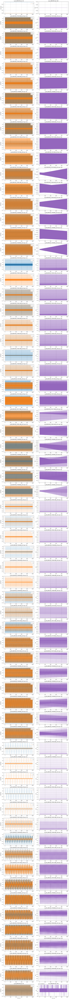

In [12]:
# Time-domain preview for all exported IQ files.
if export_summary.empty:
    raise RuntimeError("No exported IQ files found. Run the export cell first.")

N_SHOW = 2000
n_files = len(export_summary)

fig, axes = plt.subplots(
    n_files,
    2,
    figsize=(14, max(3.0 * n_files, 5.0)),
    squeeze=False,
    sharex=False,
)

metrics = []

for row_idx, (_, row) in enumerate(export_summary.iterrows()):
    iq_file = Path(row["iq_file"])

    with np.load(iq_file, allow_pickle=False) as data:
        iq = np.asarray(data["iq"]).squeeze().astype(np.complex64)
        fs_hz = float(np.asarray(data["sample_rate_hz"]).squeeze()) if "sample_rate_hz" in data.files else float(row["tx_sample_rate_hz"])

    n_show = min(N_SHOW, iq.size)
    t_us = (np.arange(n_show) / fs_hz) * 1e6

    i_sig = iq[:n_show].real
    q_sig = iq[:n_show].imag
    mag = np.abs(iq[:n_show])

    avg_power = float(np.mean(np.abs(iq) ** 2))
    peak_amp = float(np.max(np.abs(iq)))
    peak_power = peak_amp ** 2
    crest_db = 10 * np.log10(peak_power / avg_power)

    metrics.append(
        {
            "iq_file": str(iq_file),
            "samples": int(iq.size),
            "avg_power": avg_power,
            "peak_amp": peak_amp,
            "peak_power": peak_power,
            "crest_db": crest_db,
        }
    )

    ax_iq = axes[row_idx, 0]
    ax_mag = axes[row_idx, 1]

    ax_iq.plot(t_us, i_sig, label="I", linewidth=1.0)
    ax_iq.plot(t_us, q_sig, label="Q", linewidth=1.0, alpha=0.9)
    ax_iq.set_ylabel("Amplitude")
    ax_iq.set_title(f"{iq_file.name} | I/Q")
    ax_iq.grid(True)
    ax_iq.legend(loc="upper right")

    ax_mag.plot(t_us, mag, color="tab:purple", linewidth=1.0)
    ax_mag.set_ylabel("|IQ|")
    ax_mag.set_title(f"{iq_file.name} | |IQ|")
    ax_mag.grid(True)

    if row_idx == n_files - 1:
        ax_iq.set_xlabel("Time (us)")
        ax_mag.set_xlabel("Time (us)")

plt.tight_layout()

time_domain_summary = pd.DataFrame(metrics)
time_domain_summary


## FFT Preview For Exported IQ Files

This section plots the complex baseband FFT (centered at DC) for each exported `.npz` file.


,iq_file,fft_size,signal_bw_hz,x_axis_span_MHz,peak_freq_MHz,peak_mag_dBFS,median_mag_dBFS
0,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.000000,-14.655321,-240.000000
1,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.166656,-20.255031,-214.909252
2,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,-0.166656,-20.014426,-214.888241
3,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,-0.166656,-19.934602,-214.853161
4,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.166656,-19.591011,-214.835756
...,...,...,...,...,...,...,...
61,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.370972,-25.939408,-213.515020
62,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.080658,-25.969864,-213.598551
63,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.209686,-25.671449,-213.537204
64,c:\Users\Calle\OneDrive\Documenten\GitHub\RF-w...,65536,1000000.0,2.0,0.048401,-25.689932,-213.349002


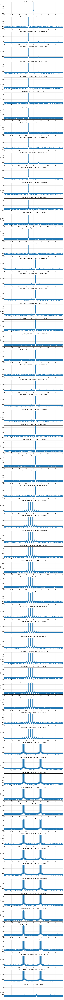

In [13]:
# FFT preview for all exported IQ files.
if export_summary.empty:
    raise RuntimeError("No exported IQ files found. Run the export cell first.")

FFT_SIZE = 65536
n_files = len(export_summary)

fig, axes = plt.subplots(
    n_files,
    1,
    figsize=(12, max(2.8 * n_files, 4.0)),
    squeeze=False,
    sharex=False,
)

fft_metrics = []

for row_idx, (_, row) in enumerate(export_summary.iterrows()):
    iq_file = Path(row["iq_file"])

    with np.load(iq_file, allow_pickle=False) as data:
        iq = np.asarray(data["iq"]).squeeze().astype(np.complex64)
        fs_hz = float(np.asarray(data["sample_rate_hz"]).squeeze()) if "sample_rate_hz" in data.files else float(row["tx_sample_rate_hz"])
        if "signal_bw_hz" in data.files:
            signal_bw_hz = float(np.asarray(data["signal_bw_hz"]).squeeze())
        elif "sample_rate_source_hz" in data.files:
            signal_bw_hz = 0.5 * float(np.asarray(data["sample_rate_source_hz"]).squeeze())
        else:
            signal_bw_hz = 0.5 * float(fs_hz)

    nfft = int(FFT_SIZE)
    n_use = min(iq.size, nfft)
    segment = np.zeros(nfft, dtype=np.complex64)
    segment[:n_use] = iq[:n_use]

    window = np.hanning(nfft).astype(np.float64)
    spec = np.fft.fftshift(np.fft.fft(segment * window, n=nfft))
    mag = np.abs(spec) / max(float(window.sum()), 1e-12)
    mag_db = 20.0 * np.log10(np.maximum(mag, 1e-12))
    f_mhz = np.fft.fftshift(np.fft.fftfreq(nfft, d=1.0 / fs_hz)) / 1e6

    ax = axes[row_idx, 0]
    ax.plot(f_mhz, mag_db, linewidth=1.0)

    bw_mhz = max(float(signal_bw_hz) / 1e6, 1e-9)
    ax.set_xlim(-bw_mhz, bw_mhz)

    ax.set_title(f"{iq_file.name} | FFT | span={2.0*bw_mhz:.3f} MHz")
    ax.set_ylabel("Magnitude (dBFS)")
    ax.grid(True, alpha=0.35)

    peak_idx = int(np.argmax(mag_db))
    fft_metrics.append(
        {
            "iq_file": str(iq_file),
            "fft_size": nfft,
            "signal_bw_hz": float(signal_bw_hz),
            "x_axis_span_MHz": float(2.0 * bw_mhz),
            "peak_freq_MHz": float(f_mhz[peak_idx]),
            "peak_mag_dBFS": float(mag_db[peak_idx]),
            "median_mag_dBFS": float(np.median(mag_db)),
        }
    )

axes[-1, 0].set_xlabel("Baseband frequency (MHz)")
plt.tight_layout()

fft_summary = pd.DataFrame(fft_metrics)
fft_summary


In [14]:
# Hard checks before UHD replay.
viol_peak = export_summary[export_summary["final_peak"] > 1.0 + 1e-6]
viol_power = export_summary[np.isnan(export_summary["final_power"]) | (export_summary["final_power"] <= 0)]

# Equal average power check.
POWER_EQ_TOL_REL = 1e-4
if len(export_summary) > 0:
    p_ref = float(export_summary["final_power"].iloc[0])
    rel_err = np.abs(export_summary["final_power"] - p_ref) / max(p_ref, 1e-12)
    viol_equal = export_summary[rel_err > POWER_EQ_TOL_REL]
else:
    viol_equal = export_summary.iloc[0:0]

print(f"Peak violations (>1.0): {len(viol_peak)}")
print(f"Invalid power rows: {len(viol_power)}")
print(f"Equal-power violations (rel tol {POWER_EQ_TOL_REL:.1e}): {len(viol_equal)}")

if len(viol_peak) > 0:
    display(viol_peak[["iq_file", "final_peak", "final_power", "peak_limited"]])
if len(viol_equal) > 0:
    display(viol_equal[["iq_file", "final_power"]])


Peak violations (>1.0): 0
Invalid power rows: 0
Equal-power violations (rel tol 1.0e-04): 0
